First step is to inport to csv with all of the data and do some anylisis on it.

-search for any null values
-make some graphs and charts to visiulize data


In [1]:
import pandas as pd
from tabulate import tabulate
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
data = pd.read_csv("Extended_Employee_Performance_and_Productivity_Data.csv")

#convert education level to numarical values from 0-3
data['Education_Level'] = data['Education_Level'].replace('High School', '0')
data['Education_Level'] = data['Education_Level'].replace('Bachelor', '1')
data['Education_Level'] = data['Education_Level'].replace('Master', '2')
data['Education_Level'] = data['Education_Level'].replace('Phd', '3')

data['Education_Level'] = pd.to_numeric(data['Education_Level'], errors='coerce')
data['Education_Level'] = data['Education_Level'].fillna(0).astype('int64')

# Display the first few rows of the dataset as a nicely formatted table
print("First five rows of the dataset:")
print(tabulate(data.head(), headers='keys', tablefmt='pretty'))

# Check for null values
print("\nNull values in each column:")
print(data.isnull().sum())

# Get data types of each column
print("\nData types of each column:")
print(data.dtypes)

# Basic statistical summary
print("\nStatistical summary of numerical columns:")
print(data.describe())

# Information on the dataset
print("\nGeneral info about the dataset:")
print(data.info())





First five rows of the dataset:
+---+-------------+------------------+--------+-----+------------+----------------------------+------------------+-----------------+-------------------+----------------+---------------------+------------------+----------------+-----------+-----------------------+-----------+----------------+------------+-----------------------------+----------+
|   | Employee_ID |    Department    | Gender | Age | Job_Title  |         Hire_Date          | Years_At_Company | Education_Level | Performance_Score | Monthly_Salary | Work_Hours_Per_Week | Projects_Handled | Overtime_Hours | Sick_Days | Remote_Work_Frequency | Team_Size | Training_Hours | Promotions | Employee_Satisfaction_Score | Resigned |
+---+-------------+------------------+--------+-----+------------+----------------------------+------------------+-----------------+-------------------+----------------+---------------------+------------------+----------------+-----------+-----------------------+-----------

In [ ]:
# I want ot see all the employess that resigned just to see if they have anything in common

# Filter for employees who resigned
resigned_employees = data[data['Resigned'] == True]

# Display the names of all employees who resigned
# Replace 'Employee_Name' with the actual column name for employee names in your dataset
print("List of employees who resigned:")
print(tabulate(resigned_employees[['Employee_ID',  'Department', 'Gender', 'Age',  'Job_Title',  'Hire_Date',  'Years_At_Company',  'Education_Level',  'Performance_Score', 'Monthly_Salary',  'Work_Hours_Per_Week', 'Projects_Handled',  'Overtime_Hours',  'Sick_Days', 'Remote_Work_Frequency', 'Team_Size',  'Training_Hours',  'Promotions',  'Employee_Satisfaction_Score']], headers='keys', tablefmt='pretty'))

List of employees who resigned:
+-------+-------------+------------------+--------+-----+------------+----------------------------+------------------+-----------------+-------------------+----------------+---------------------+------------------+----------------+-----------+-----------------------+-----------+----------------+------------+-----------------------------+
|       | Employee_ID |    Department    | Gender | Age | Job_Title  |         Hire_Date          | Years_At_Company | Education_Level | Performance_Score | Monthly_Salary | Work_Hours_Per_Week | Projects_Handled | Overtime_Hours | Sick_Days | Remote_Work_Frequency | Team_Size | Training_Hours | Promotions | Employee_Satisfaction_Score |
+-------+-------------+------------------+--------+-----+------------+----------------------------+------------------+-----------------+-------------------+----------------+---------------------+------------------+----------------+-----------+-----------------------+-----------+---------

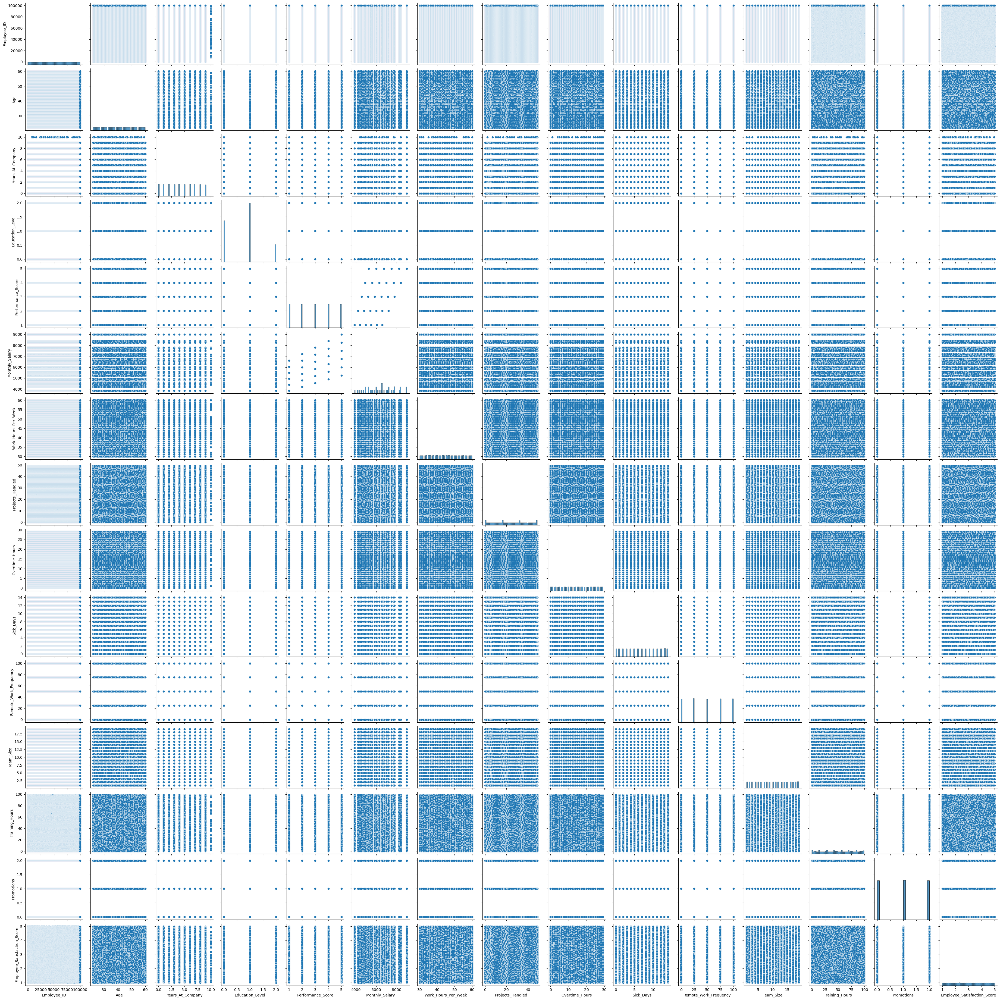

In [2]:
#Visualize the distribution of numerical columns.
# Select numerical columns only
numerical_cols = data.select_dtypes(include=['float64', 'int64'])

# Create pairplot for the numerical columns
sns.pairplot(numerical_cols)

# Show the plot
plt.show()

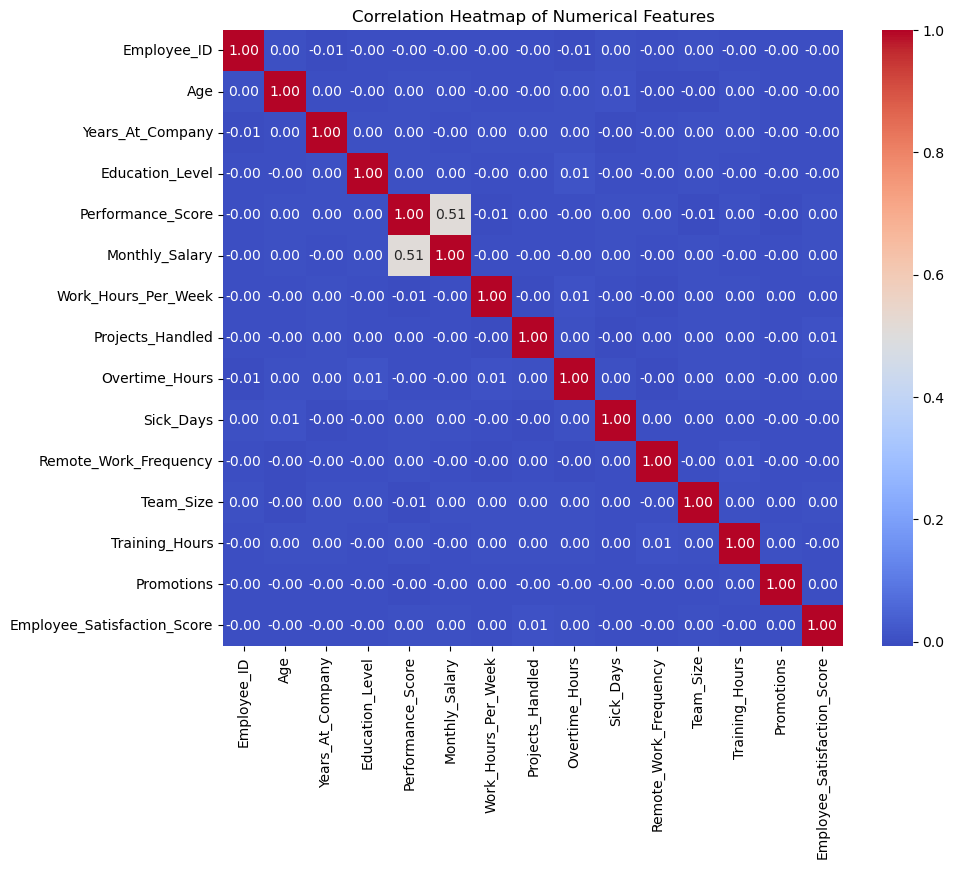

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [4]:
#create a correlation heatmap
# Select only the numerical features from the dataset
numerical_features = data.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

# Feature Extraction for Individual Departments

In [7]:
#create a list of all the departments in dataset
df = data['Department']
dept = []

for i in df:
    if i not in dept:
        dept.append(i)
print("list of all departments:")
print(dept)

list of all departments:
['IT', 'Finance', 'Customer Support', 'Engineering', 'Marketing', 'HR', 'Operations', 'Sales', 'Legal']


In [12]:
#create dataframes of each departments

dfIt = data[data['Department'] == 'IT']
dfFin = data[data['Department'] == 'Finance']
dfSup = data[data['Department'] == 'Customer Support']
dfEng = data[data['Department'] == 'Engineering']
dfMark = data[data['Department'] == 'Marketing']
dfOper = data[data['Department'] == 'Operations']
dfSales = data[data['Department'] == 'Sales']
dfLegal = data[data['Department'] == 'Legal']
dfHr = data[data['Department'] == 'HR']


# Create Correlation Heatmaps for each department 

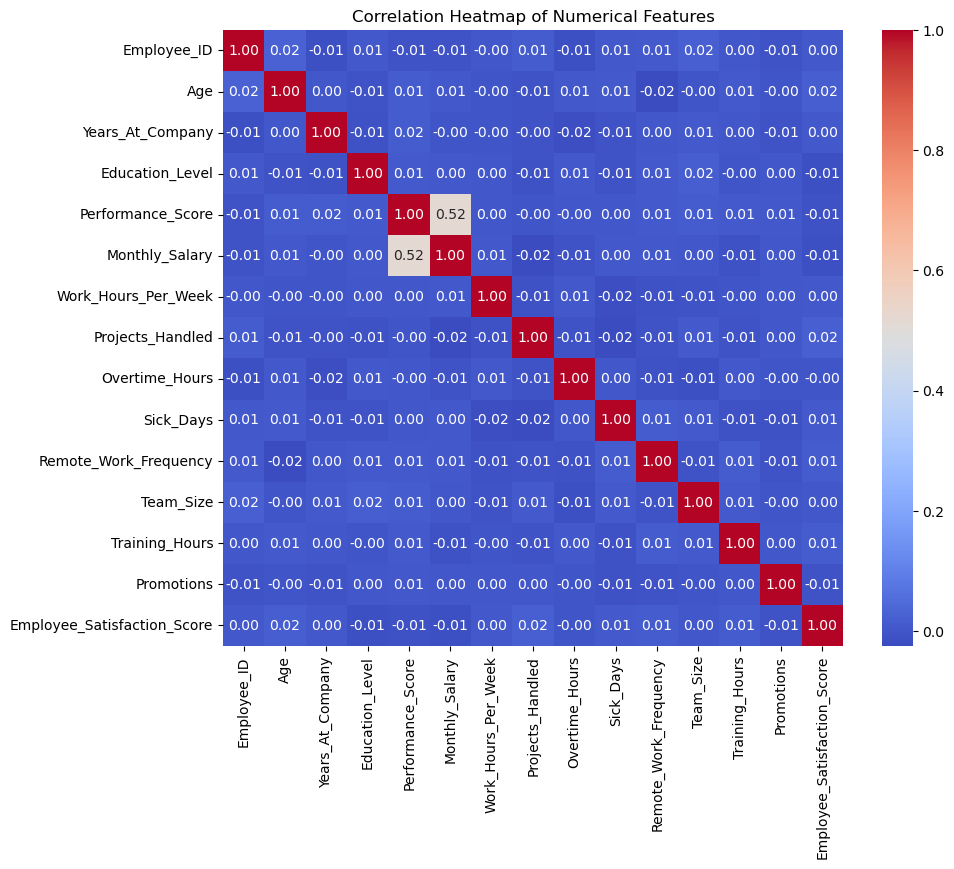

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [10]:
#create a correlation heatmap for IT
# Select only the numerical features from the dataset
numerical_features = dfIt.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

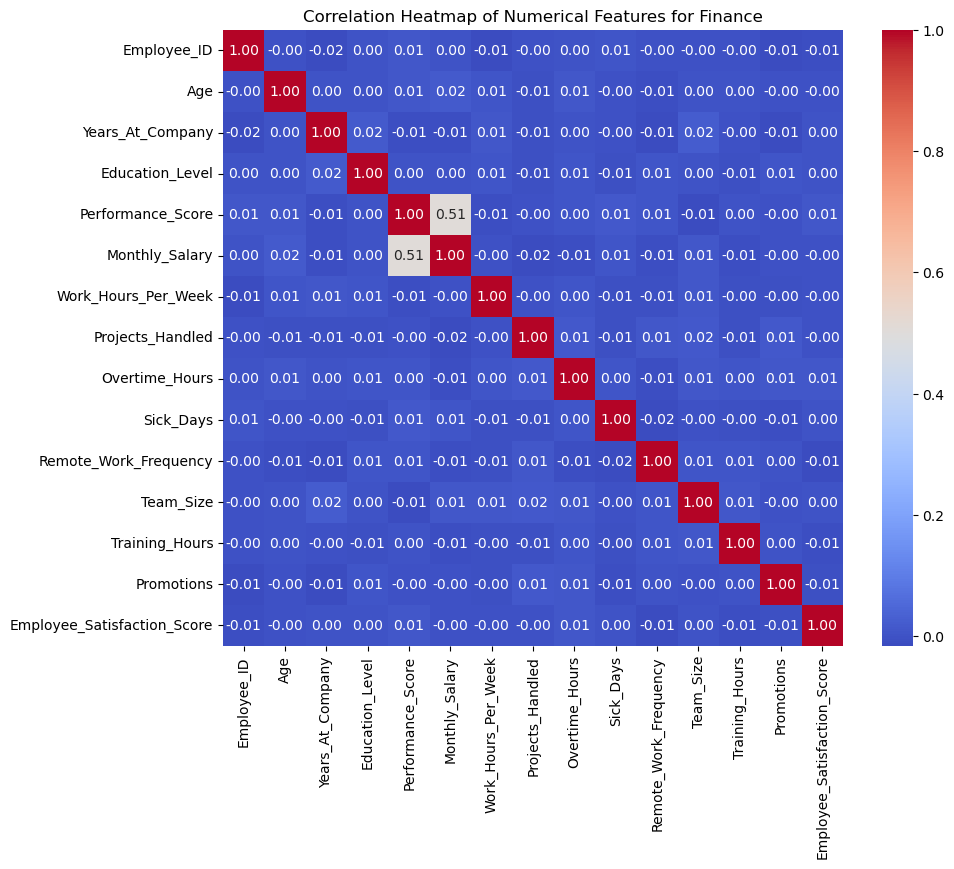

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [15]:
#create a correlation heatmap for Finance
# Select only the numerical features from the dataset
numerical_features = dfFin.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Finance')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

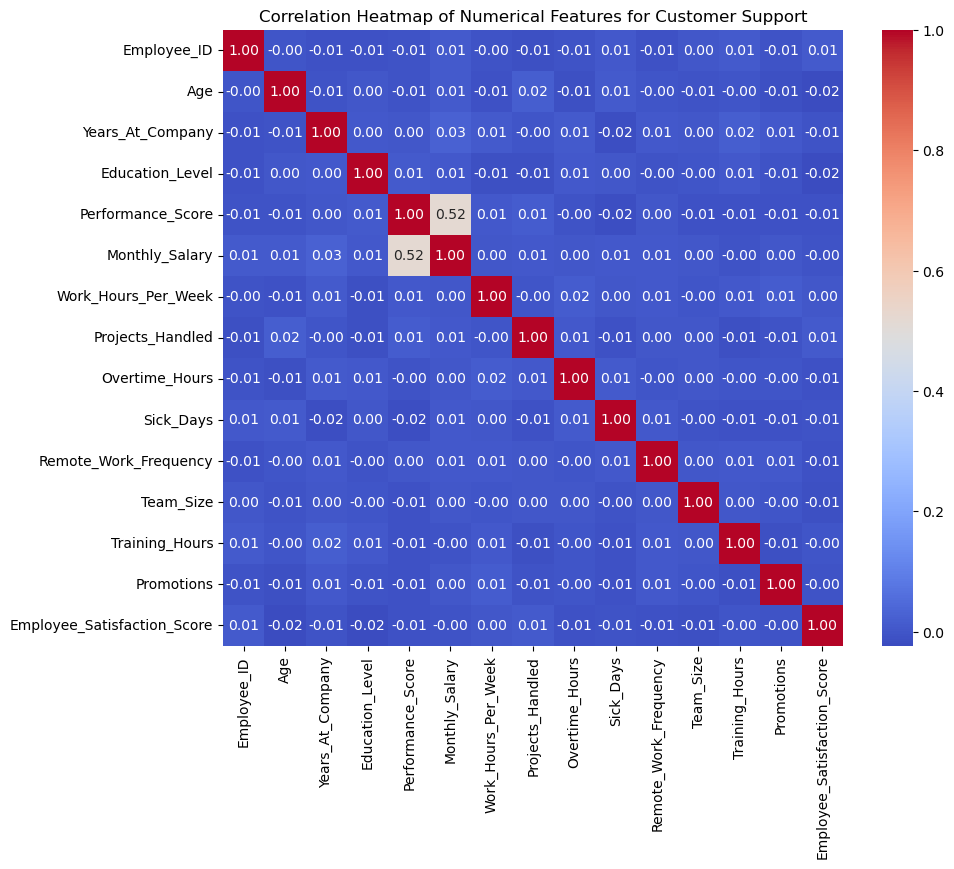

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [16]:
#create a correlation heatmap for Customer Support
# Select only the numerical features from the dataset
numerical_features = dfSup.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Customer Support')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

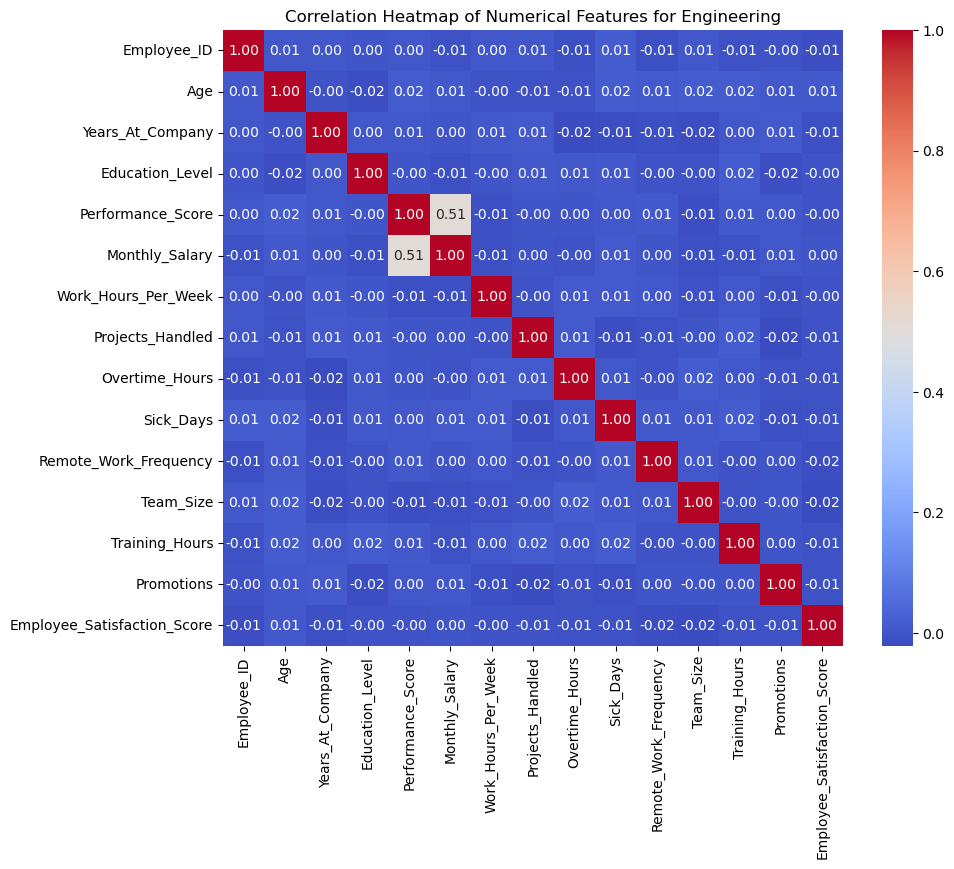

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [17]:
#create a correlation heatmap for Engineering
# Select only the numerical features from the dataset
numerical_features = dfEng.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Engineering')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

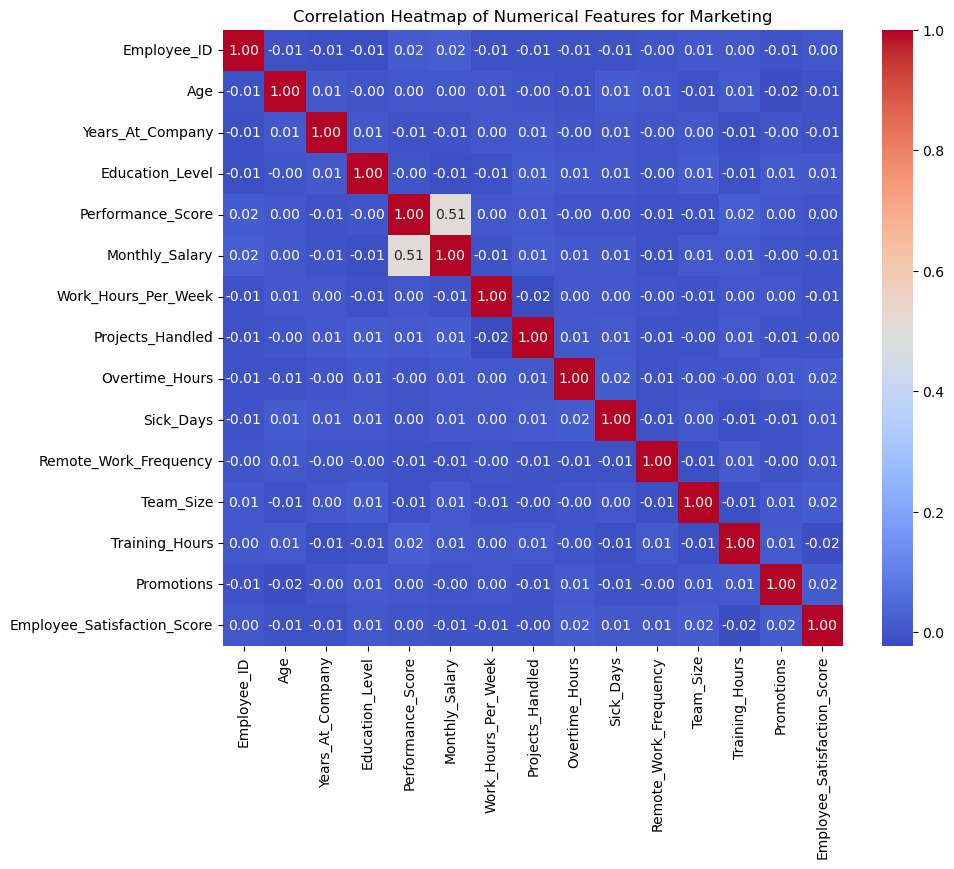

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [18]:
#create a correlation heatmap for Marketing
# Select only the numerical features from the dataset
numerical_features = dfMark.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Marketing')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

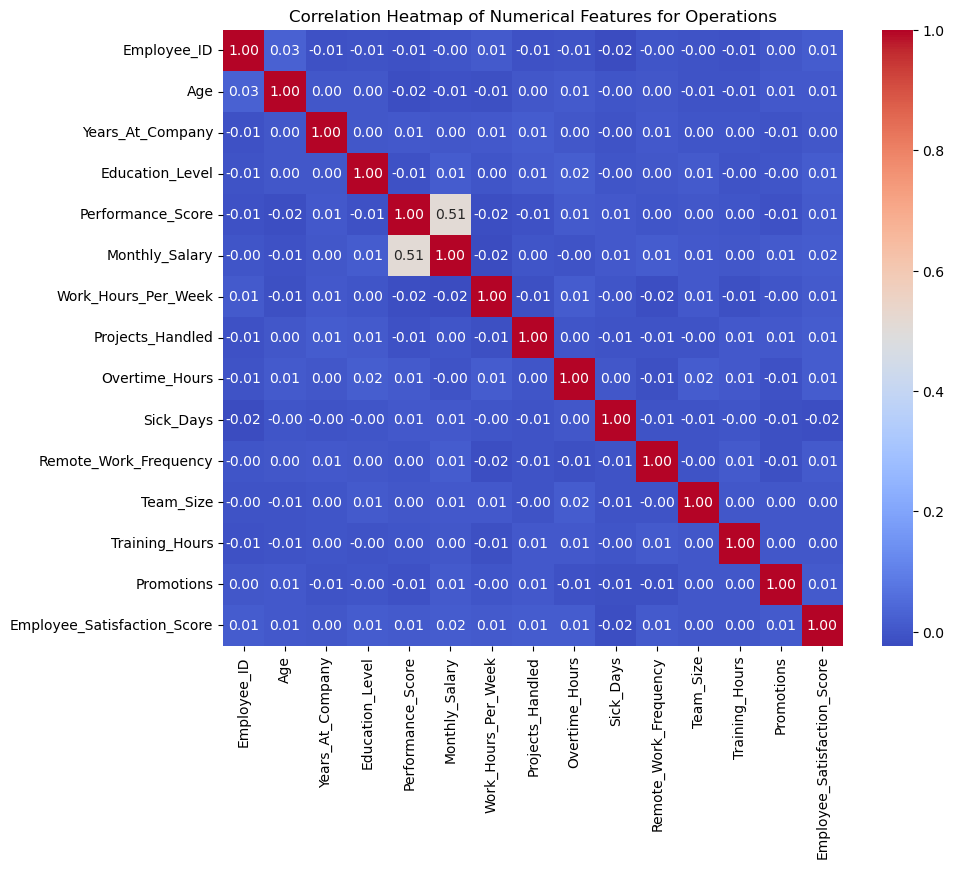

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [19]:
#create a correlation heatmap for Operations
# Select only the numerical features from the dataset
numerical_features = dfOper.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Operations')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

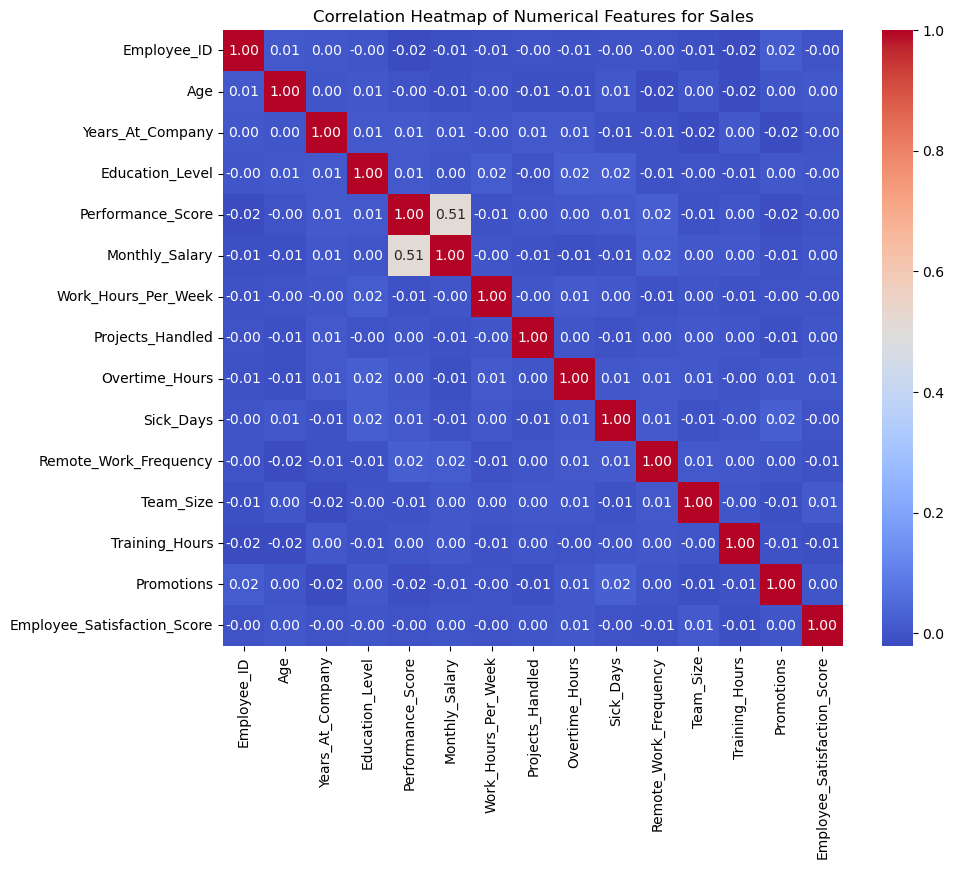

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [20]:
#create a correlation heatmap for Sales
# Select only the numerical features from the dataset
numerical_features = dfSales.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Sales')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

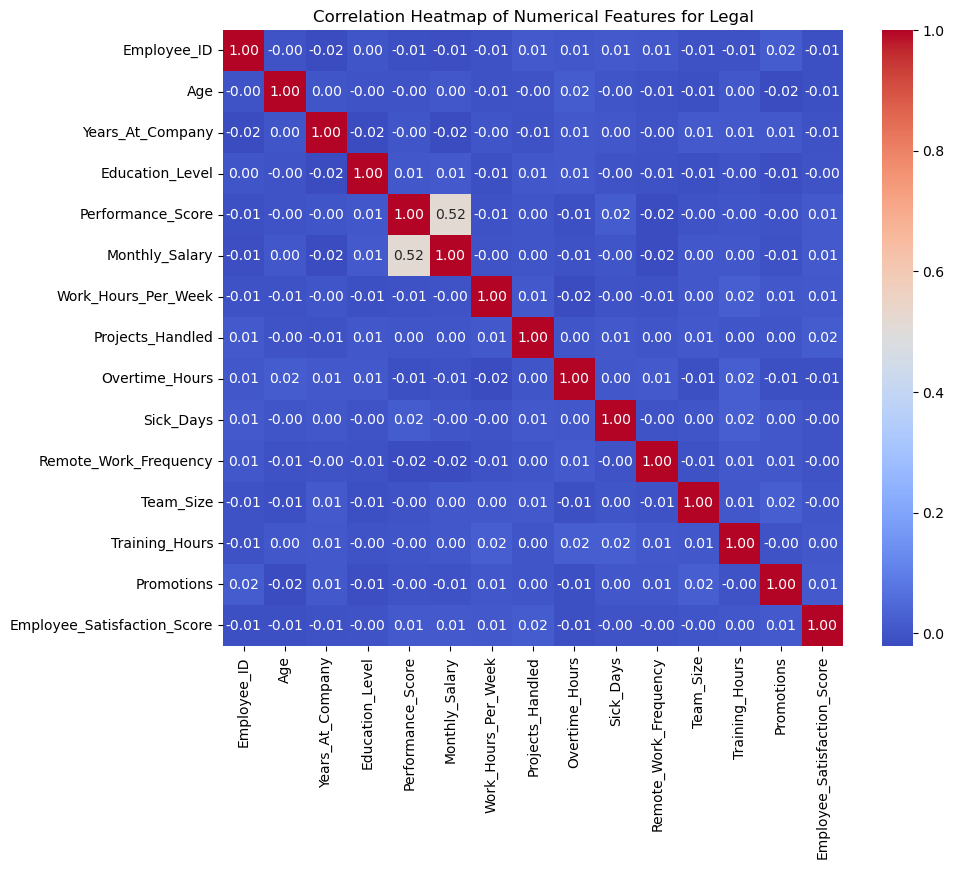

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [21]:
#create a correlation heatmap for Legal
# Select only the numerical features from the dataset
numerical_features = dfLegal.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for Legal')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

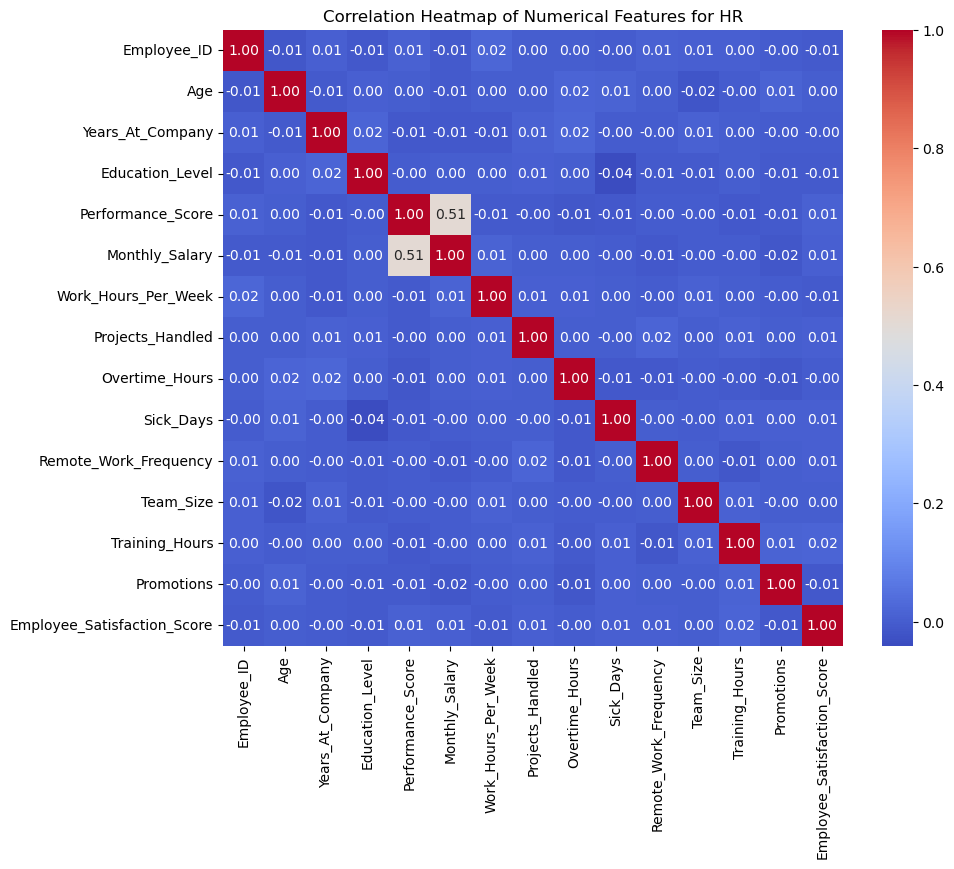

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [22]:
#create a correlation heatmap for HR
# Select only the numerical features from the dataset
numerical_features = dfHr.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix for numerical features
correlation_matrix = numerical_features.corr()

# Display the correlation matrix
correlation_matrix


# Plot a heatmap to visualize the correlation between numerical features
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features for HR')
plt.show()

# Identify the most correlated feature with the target variable 'Performance_Score'
target = 'Performance_Score'
most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")